In [1]:
TEST = '/kaggle/input/ship-classification/FGSC-23/test'
TRAIN = '/kaggle/input/ship-classification/FGSC-23/train'

We want to use image embeddings for both EDA and classification, so let's add some code to get image embeddings using ResNeXt without fine-tuning.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


100%|██████████| 95.8M/95.8M [00:00<00:00, 337MB/s]


Let's load up our data, including image embeddings and thumbnails.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image

THUMBNAIL_SIZE = (48, 48)

def embed(model, filename: str):
    try:
        with Image.open(fp=filename, mode='r') as image:
            return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)
    except: 
        print(filename)
        return None


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'])
        for index, input_file in enumerate(list(iglob(pathname=arg))) if index < 100]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder)}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*') if isdir(folder)}
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in test_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

encoded 70 rows of 7  in 0:00:08.269453
encoded 100 rows of 17  in 0:00:11.228742
encoded 82 rows of 19  in 0:00:09.256556
encoded 43 rows of 22  in 0:00:04.938564
encoded 100 rows of 2  in 0:00:11.742763
encoded 100 rows of 10  in 0:00:11.373163
encoded 72 rows of 5  in 0:00:08.315975
encoded 70 rows of 20  in 0:00:07.845156
encoded 100 rows of 8  in 0:00:11.766666
encoded 100 rows of 12  in 0:00:11.111861
encoded 100 rows of 0  in 0:00:10.927917
encoded 100 rows of 18  in 0:00:11.153592
encoded 96 rows of 16  in 0:00:10.395473
encoded 100 rows of 13  in 0:00:11.139925
encoded 58 rows of 15  in 0:00:06.647016
encoded 86 rows of 3  in 0:00:09.661768
encoded 100 rows of 1  in 0:00:11.707568
encoded 81 rows of 14  in 0:00:09.184388
encoded 100 rows of 4  in 0:00:11.053430
encoded 71 rows of 9  in 0:00:07.959085
encoded 74 rows of 21  in 0:00:07.975331
encoded 100 rows of 6  in 0:00:10.909558
encoded 17 rows of 11  in 0:00:01.978559
encoded 18 rows of 7  in 0:00:02.004027
encoded 69 rows 

Our classes are not balanced; how badly imbalanced are they?

In [4]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,17,10,2,18,0,12,8,13,6,4,...,19,14,21,5,9,7,20,15,22,11
proportion,0.052083,0.052083,0.052083,0.052083,0.052083,0.052083,0.052083,0.052083,0.052083,0.052083,...,0.042708,0.042188,0.038542,0.0375,0.036979,0.036458,0.036458,0.030208,0.022396,0.008854


Some of our classes are poorly represented in our training data, and we should expect that we won't be able to resolve all of the classes accurately.

Next let's use TSNE to add x/y coordinates based on our image embeddings. 

In [5]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))
test_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
test_df[['x', 'y']] = test_reducer.fit_transform(X=test_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1920 samples in 0.013s...
[t-SNE] Computed neighbors for 1920 samples in 0.304s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1920
[t-SNE] Computed conditional probabilities for sample 1920 / 1920
[t-SNE] Mean sigma: 3.354412
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.890762
[t-SNE] KL divergence after 1000 iterations: 1.651198
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 816 samples in 0.004s...
[t-SNE] Computed neighbors for 816 samples in 0.063s...
[t-SNE] Computed conditional probabilities for sample 816 / 816
[t-SNE] Mean sigma: 3.581150
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.026718
[t-SNE] KL divergence after 1000 iterations: 1.430866


Let's plot.

In [6]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: ships', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? A handful of classes seem to be clustered, but by and large we have a lot of mixing. We should have moderate expectations regarding model accuracy. Let's build a model and see what we get.

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

logreg = LogisticRegression(max_iter=10000, tol=1e-12).fit(train_df['value'].apply(func=pd.Series), train_df['tag'])
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print(classification_report(zero_division=0.0, y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series))))

model fit in 1088 iterations
accuracy: 0.6152
f1: 0.6151
              precision    recall  f1-score   support

           0       0.81      0.60      0.69        97
           1       0.69      0.74      0.71        34
          10       0.72      0.69      0.70        48
          11       0.90      0.90      0.90        10
          12       0.58      0.90      0.70        29
          13       0.50      0.40      0.44        45
          14       0.62      0.79      0.70        19
          15       0.63      0.86      0.73        14
          16       0.92      1.00      0.96        24
          17       0.60      0.45      0.51        69
          18       0.67      0.79      0.72        33
          19       0.34      0.55      0.42        20
           2       0.62      0.50      0.56       100
          20       0.34      0.56      0.43        18
          21       0.95      1.00      0.98        20
          22       1.00      0.91      0.95        11
           3       0.42 

What do we see? We see a lot of variability in accuracy from model to model, which is not surprising given what we saw in the TSNE scatter plot above. Let's have a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

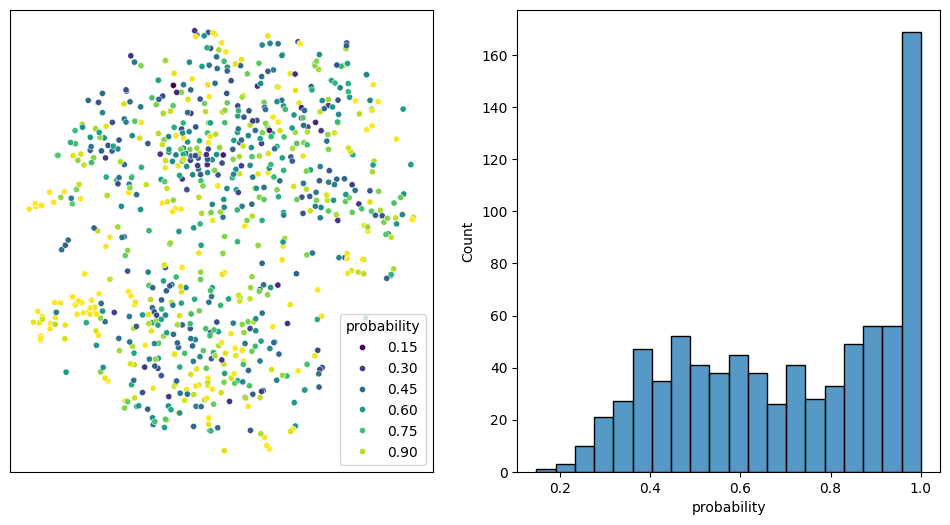

In [8]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = test_df[['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=test_df['value'].apply(func=pd.Series)), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', s=20)
ax[0].set(xlabel=None)
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

We have a handful of clusters with high model probabilities, but generally our model probabilities run the gamut. This is a tough problem.